# Exploratory Data Analysis Exercise
* For this part we will be using the `data/cars.csv` dataset

In [70]:
# Import the libraries you'll need here.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%matplotlib inline
import scipy.stats as stats

# Load the cars csv file into a pandas dataframe.


In [71]:
# Load the csv file into a pandas dataframe.

df = pd.read_csv('data/cars.csv')
df.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,18,3916,34500


# Data clean up part 1.

1. Print the number of duplicate rows we have in our dataframe.

2. Modify our df to have all duplicate rows removed. 

3. Do a sanity check to make sure all duplicates have been removed by printing the total number of duplicate rows again.

In [72]:
# 1. Print the number of duplicate rows we have in our dataframe.

df.duplicated().sum()

720

In [73]:
#  2. Modify our df to have all duplicate rows removed. 

df = df.drop_duplicates()

In [74]:
# 3. Do a sanity check to make sure all duplicates have been removed by printing the total number of duplicate rows again.

df.duplicated().sum()

0

# Data clean up part 2.
* Which column has the most null values and how many null values does it have?
* Print how long our dataframe is.
* Remove any row that has a null value in it. 
* Do a sanity check and pring how long our dataframe is now that we have removed our null values.

In [75]:
# * Which column has the most null values and how many null values does it have?

df.isnull().sum()

Make                  0
Model                 0
Year                  0
Engine Fuel Type      3
Engine HP            69
Engine Cylinders     30
Transmission Type     0
Driven_Wheels         0
Number of Doors       6
Vehicle Size          0
Vehicle Style         0
highway MPG           0
city mpg              0
Popularity            0
MSRP                  0
dtype: int64

In [76]:
# * Print how long (aka how many rows) our dataframe is.

df.shape

(11194, 15)

In [77]:
# * Remove any row that has a null value in it. 

df = df.dropna()

In [78]:
# * Do a sanity check and pring how long our dataframe is now that we have removed our null values.

df.shape

(11092, 15)

### Make a bar chart that displays how many times each brand of car appears in this data. 
_Brand of car is the `Make` of the car._

In [79]:
df.head(3)

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350


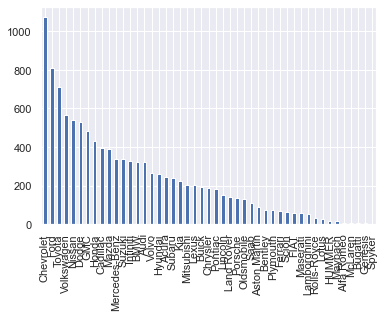

In [80]:
# Make a bar chart that displays how many times each brand of car appears in this data. 

bm = df['Make'].value_counts()
bm.plot(kind = 'bar');

# Make the cart more legible, by making it a horizontal bar chart and changing the figure size.

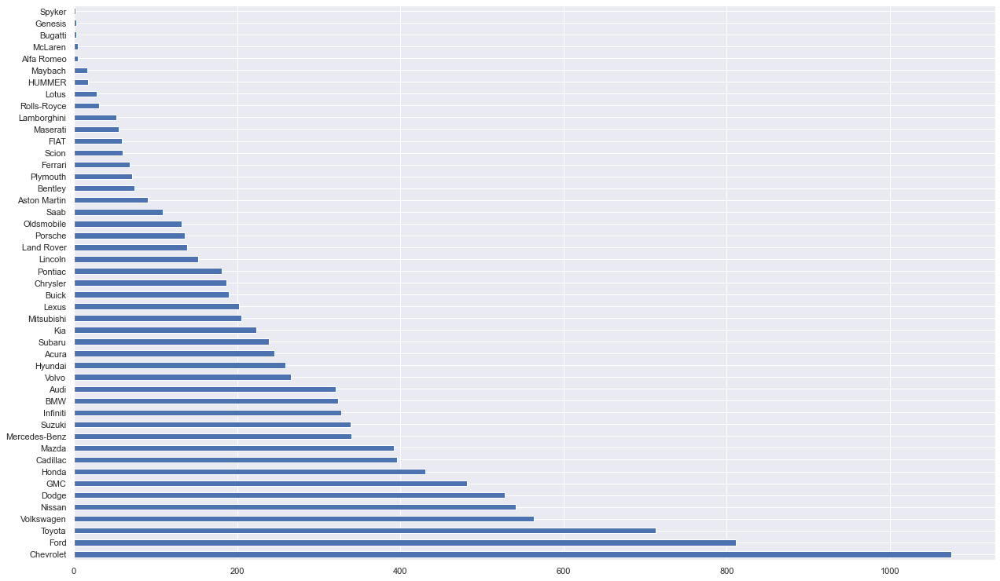

In [81]:
# Make the cart more legible, by making it a horizontal bar chart and changing the figure size.

bm.plot(kind = 'barh', figsize=(21, 13));

### Make a timeline line chart in which the x-axis is the year, and the y-axis is the average MSRP.
* What's noticeable about it and what do you think the error is...


<AxesSubplot:title={'center':'Average MSRP by Year: 1990-2017'}, xlabel='Year', ylabel='Avg. MSRP'>

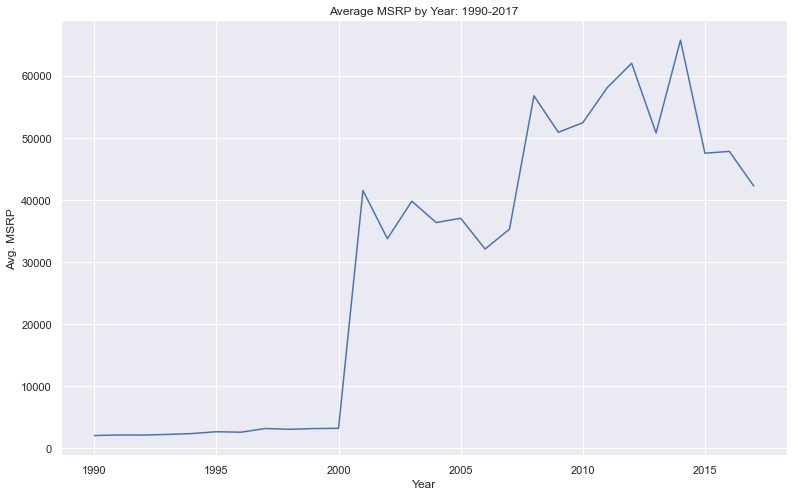

In [82]:
# Make a timeline line chart in which the x-axis is the year, and the y-axis is the average MSRP.

df.head()
by_year = df.groupby('Year').mean()['MSRP']
by_year.plot(kind = 'line', 
        x = 'Year', 
        y = 'MSRP', 
        figsize = (13, 8), 
        title = 'Average MSRP by Year: 1990-2017',
        xlabel = 'Year',
        ylabel = 'Avg. MSRP')


# It seems as though in the years before 2000, they were counting in tens.
Make a new column that is called `adjusted_price`, that contains all prices, however, for 
every year before 2000 make it 10x the original MSRP.  
_Hint use `np.where()`_.

In [84]:
# Make a new column that is called `adjusted_price`, that contains all prices, however, for every year before 2000 make it 10x the original MSRP.

select_cond = df['Year'] <= 2000

# np.where(condition, x, y):
# if you find the condition, do x, otherwise, do y

df['adjusted_price'] = np.where(select_cond, df['MSRP'] * 10, df['MSRP'])

df[select_cond].head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP,adjusted_price
17,Audi,100,1992,regular unleaded,172.0,6.0,MANUAL,front wheel drive,4.0,Midsize,Sedan,24,17,3105,2000,20000
19,Audi,100,1992,regular unleaded,172.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,Wagon,20,16,3105,2000,20000
21,Audi,100,1992,regular unleaded,172.0,6.0,MANUAL,all wheel drive,4.0,Midsize,Sedan,21,16,3105,2000,20000
22,Audi,100,1993,regular unleaded,172.0,6.0,MANUAL,front wheel drive,4.0,Midsize,Sedan,24,17,3105,2000,20000
23,Audi,100,1993,regular unleaded,172.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,Wagon,20,16,3105,2000,20000


# Replot the new adjusted price.  
* Make the y-axis start at 0 and go up to 100,000

<AxesSubplot:title={'center':'Average MSRP by Year: 1990-2017'}, xlabel='Year', ylabel='Avg. MSRP'>

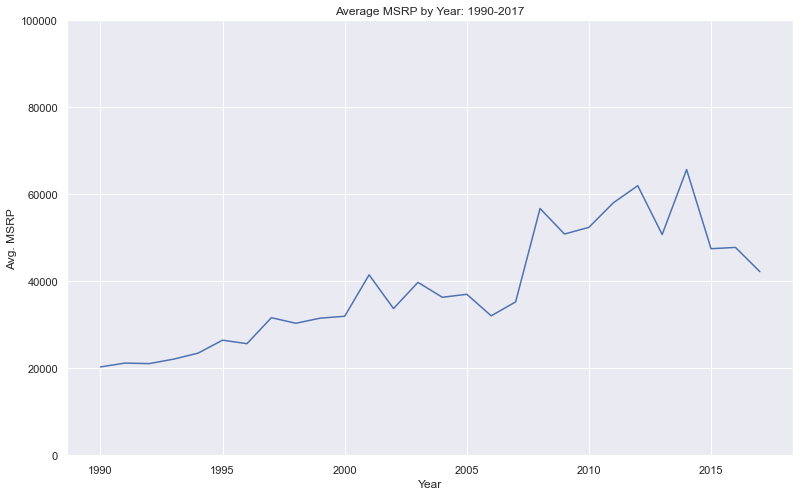

In [86]:
# Replot the new adjusted price and make the y-axis start at 0 and go up to 100,000

by_year_1 = df.groupby('Year').mean()['adjusted_price']
by_year_1.plot(kind = 'line', 
        x = 'Year', 
        y = 'MSRP', 
        figsize = (13, 8), 
        title = 'Average MSRP by Year: 1990-2017',
        xlabel = 'Year',
        ylabel = 'Avg. MSRP',
        ylim = [0,100000])

# What car makers make the most expensive cars on average. 
* I only want the top 5, make sure your answer is the top 5 and only the top 5. _Hint, you can use df.head(5) for this_.
* Use our `adjusted_price` column for this

# Question: 

In [90]:
# What top 5 car makers make the most expensive cars on average. 

# how do you do this by using df.head()

by_maker_avg_price = df.groupby('Make')['adjusted_price'].mean()
by_maker_avg_price = by_maker_avg_price.sort_values(ascending = False)
#by_maker_avg_price
#by_maker_avg_price.nlargest(5)
by_maker_avg_price.head(5).round()

Make
Bugatti        1757224.0
Maybach         546222.0
Rolls-Royce     351131.0
Lamborghini     331567.0
Bentley         247169.0
Name: adjusted_price, dtype: float64

# What are the top 5 car makers that have the highest median highway MPG?

In [91]:
# Which car makers have the highest median highway MPG?

df.head()
by_maker_MPG = df.groupby('Make')['highway MPG'].median()
by_maker_MPG.nlargest(5)

Make
Alfa Romeo    34
FIAT          33
Honda         32
Scion         32
Volkswagen    32
Name: highway MPG, dtype: int64

# Using `sns.histplot`, make histogram of the adjusted_price of just these car makers.
* ['Chevrolet', 'Ford', 'Toyota']

# Question

In [47]:
# Using `sns.histplot`, make histogram of the adjusted_price of just these car makers.

# group by + mean of adjusted price?
# bream them up into bind? 

chevy = df['Make'] == 'Chevrolet'
ford = df['Make'] == 'Ford'
toyota = df['Make'] == 'Toyota'

all_three = df[chevy | ford | toyota]

#all_three.head()

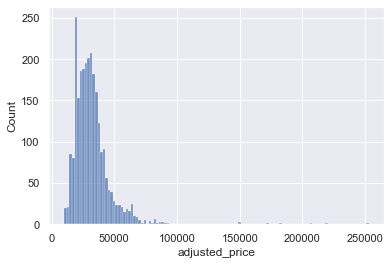

In [93]:
# What does this mean?

ax = sns.histplot(data = all_three, 
                  x = 'adjusted_price')

# Remake the same histogram, but limit the x-axis from 0 to 100,000

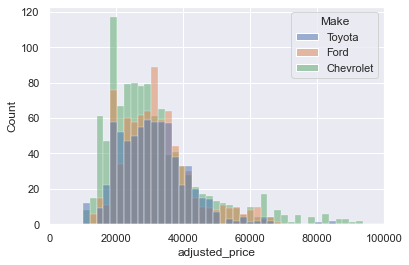

In [94]:
# Remake the same histogram, but limit the x-axis from 0 to 100,000
ax = sns.histplot(data = all_three, 
                  x = 'adjusted_price', 
                  hue = 'Make')
ax.set_xbound(0, 100000)

# Plot the relationship between Engine HP and highway MPG

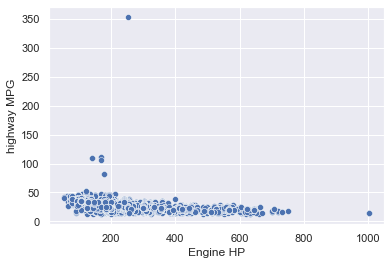

In [95]:
# Plot the relationship between Engine HP and highway MPG

df.head()
ax2 = sns.scatterplot(data = df, x = 'Engine HP', y = 'highway MPG')

# Remove any statisical outliers from Engine HP and highway MPG and plot the result.
* Statisical outliers meaning values that are further than 3 standard deviations from the mean 
* Create a new columns for z-scores for each 'Engine HP' and 'highway MPG' named 'Engine HP_zscore' and 'highway MPG_zscore'
* Calculate the z-scores for each of our target columns.
* Make sure you set the z-scores to be their absolute values. 
* Create condition masks for when either of those absolute values are greater than 3.

* Create a new dataframe that is a copy of our dataframe using df.copy()

* Using our new dataframe
    * Filter out all Engine HP Z-Scores that are greater than 3
    * Filter out all Highway MPG z-scores that are greater than 3.
    * Make the same scatterplot plotting the relationship of Engine HP and Highway MPG as before but with the this dataframe.

# Question

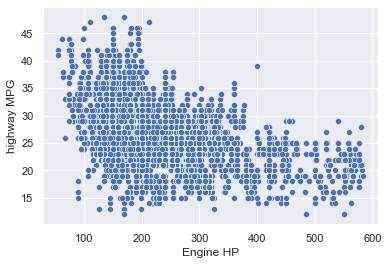

In [96]:
# Remove any statisical outliers from Engine HP and highway MPG

# list of needed columns only
select_cols = ['Engine HP', 'highway MPG']

# empty list of new z-score columns
z_score_cols = []

# Loop through the selected columns - HP and MPG
for col in select_cols:
    
    # create new col name that is old col name + 'z_score'
    new_col_name = col + '_zscore'
    
    # call the z-score function on the HP and MPG cols 
    # set them equal to new col name
    df[new_col_name] = stats.stats.zscore(df[col])
    
    # convert values to abs values
    df[new_col_name] = abs(df[new_col_name])
      
    # append new column name to z_score_cols list
    z_score_cols.append(new_col_name)

newdf = df.copy()

# make a selection condition z-score is less than 3
condition1 = newdf['Engine HP_zscore'] < 3
condition2 = newdf['highway MPG_zscore'] < 3

# condition = df[z_score_cols] < 3 

# if any of the row is true, set to true, else set to false

# condition = condition.any(axis=1)

newdf = newdf[condition1 & condition2]

# newdf[newdf['Engine HP_zscore'] > 3] -> test1, should show no results
# newdf[newdf['highway MPG_zscore'] > 3] -> test2, should show no results

# new scatter plot with new data frame
ax3 = sns.scatterplot(data = newdf, x = 'Engine HP', y = 'highway MPG')

# What does this plot tell you about how Engine HP affects highway MPG?

In [76]:
# What does this plot tell you about how Engine HP affects highway MPG?
print('The higher the HP of an engine the lower the highway MPG?')

The higher the HP of an engine the lower the highway MPG?


# Using a pairplot, display all of the linear relationships.
* Which variables look like they have the strongest linear relationship (Besides MSRP and adjusted_price).

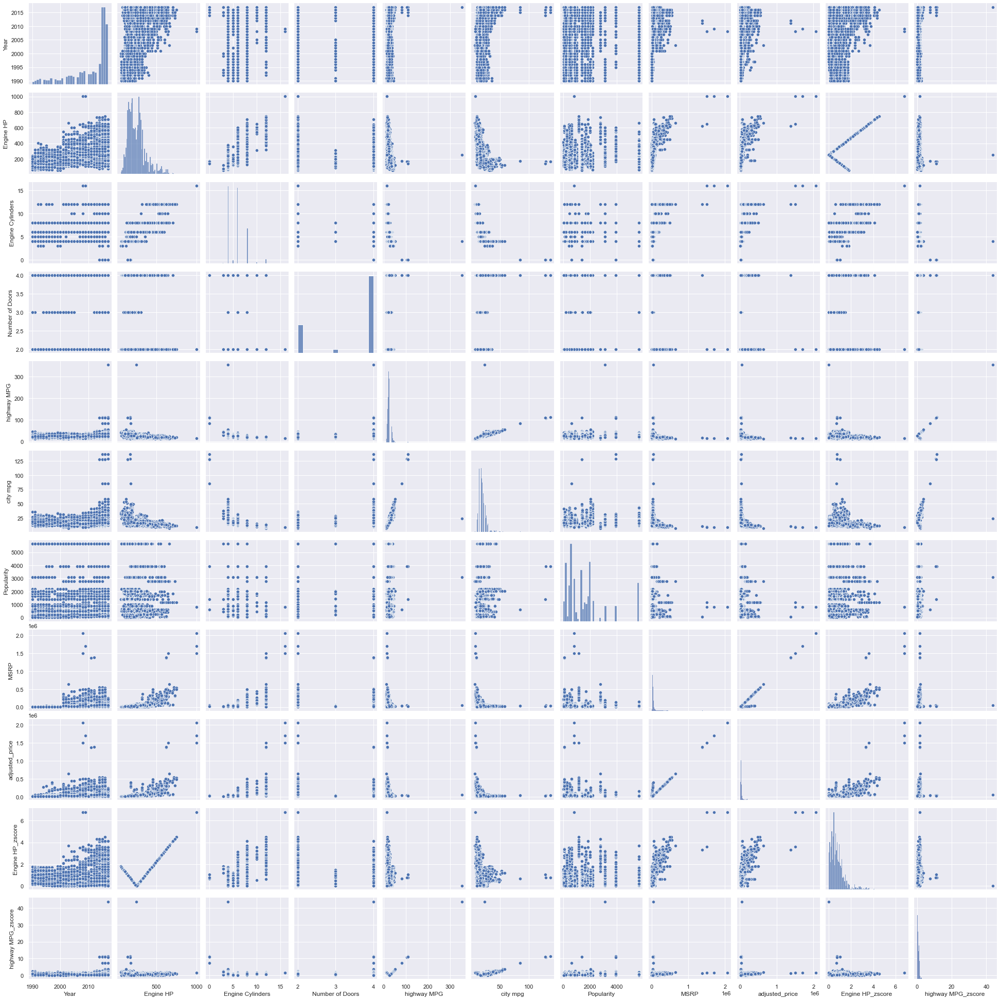

In [99]:
# Using a pairplot, display all of the linear relationship.

sns.pairplot(df);

In [25]:
# * Which variables look like they have the strongest linear relationship (Besides MSRP and adjusted_price).

print('highway mpg and city mpg')

highway mpg and city mpg


# Find which features actually have the strongest linear relationship using correlations.
* Make a heatmap plot of all of the correlations in our dataset.
* Change the figure size of our heatmap plot to be 8x8
* Which feature does Engine HP have the strongest relationship with, and why do you think that relationship exists.

<AxesSubplot:>

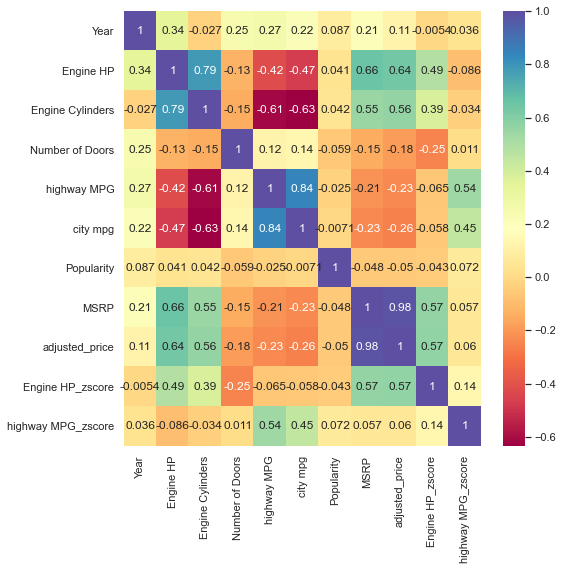

In [100]:
# * Make a heatmap plot of all of the correlations in our dataset.
# * Change the figure size of our heatmap plot to be 8x8
f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(df.corr(), annot=True, cmap='Spectral', annot_kws={'size': 12})

# [EXTRA CREDIT] 
* In the column names, replace all the spaces with an underscore, and make them all lowercase as well
* Using subplots, display the histogram of adjusted_price for 'Ford' and 'Toyota' appear on charts side by side. 
    * `f, axes = plt.subplots(1, 2, figsize=(13,5))`



In [101]:
# * In the column names, replace all the spaces with an underscore, and make them all lowercase as well

df_newcols = df.copy()

df_newcols = df_newcols.rename(columns = lambda col: col.lower()) # stage 1 - all lower case
df_newcols = df_newcols.rename(columns = lambda col: col.replace(' ', '_')) # stage2 - spaces

df_newcols.head()

,make,model,year,engine_fuel_type,engine_hp,engine_cylinders,transmission_type,driven_wheels,number_of_doors,vehicle_size,vehicle_style,highway_mpg,city_mpg,popularity,msrp,adjusted_price,engine_hp_zscore,highway_mpg_zscore
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135,46135,0.739442,0.036479
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650,40650,0.421779,0.230863
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350,36350,0.421779,0.230863
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,18,3916,29450,29450,0.213547,0.230863
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,18,3916,34500,34500,0.213547,0.230863


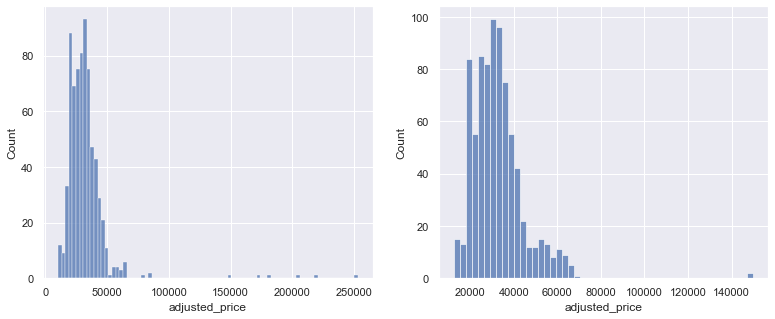

In [27]:
# Using subplots, display the histogram of adjusted_price for 'Ford' and 'Toyota' appear on charts side by side.

f, axes = plt.subplots(1, 2, figsize=(13,5))
toyota = df[df['Make'] == 'Toyota']
ford = df[df['Make'] == 'Ford']
ax = sns.histplot(data = toyota, x = 'adjusted_price', ax = axes[0])
ax = sns.histplot(data = ford, x = 'adjusted_price', ax = axes[1])

# Extra Credit part 2
Rebuild the charts you made but using the interactive plotting library, Plotly:  https://plotly.com/python/.  
* You may need to install plotly by running `pip install plotly` in your terminal. 

In [103]:
#1 Make a bar chart that displays how many times each brand of car appears in this data. 
import plotly.express as px
df.head()
bm = df['Make'].value_counts()
fig = px.bar(bm, title = 'Make and Qty')
fig.update_xaxes(title = 'Make')
fig.update_yaxes(title = 'Qty')

In [163]:
fig = px.bar(bm, orientation = 'h', height = 600, width = 1000, title = 'Make Vs Qty')
fig.update_xaxes(title = 'Qty')
fig.update_yaxes(title = 'Make')

In [165]:
#2 Make a timeline line chart in which the x-axis is the year, and the y-axis is the average MSRP.

by_year = df.groupby('Year').mean()['MSRP']

fig = px.line(by_year, title = 'Year VS Avergae MSRP')
fig.update_xaxes(title = 'Year')
fig.update_yaxes(title = 'Avg. MSRP')

In [24]:
# Replot the new adjusted price and make the y-axis start at 0 and go up to 100,000

by_year_1 = df.groupby('Year').mean()['adjusted_price']
fig = px.line(by_year_1, title = 'Year VS Mean Adjusted Price')
fig.update_layout(yaxis = dict(range=[0,100000]))
fig.update_xaxes(title = 'Year')
fig.update_yaxes(title = 'Mean Adjusted Price')

# Question

In [104]:
#3 Make histogram of the adjusted_price of just these car makers: Chevrolet, Ford, Toyota

chevy = df['Make'] == 'Chevrolet'
ford = df['Make'] == 'Ford'
toyota = df['Make'] == 'Toyota'

all_three = df[chevy | ford | toyota]
fig = px.histogram(all_three, x = 'adjusted_price')
fig

In [177]:
#4 Plot the relationship between Engine HP and highway MPG

fig = px.scatter(df, x = 'Engine HP', y = 'highway MPG')
fig

In [187]:
#5 # Using a pairplot, display all of the linear relationship.
df.head()
fig = px.scatter_matrix(df)

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP,adjusted_price,Engine HP_zscore,highway MPG_zscore
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135,46135,0.739442,0.036479
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650,40650,0.421779,0.230863
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350,36350,0.421779,0.230863
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,18,3916,29450,29450,0.213547,0.230863
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,18,3916,34500,34500,0.213547,0.230863


In [195]:
#6 * Make a heatmap plot of all of the correlations in our dataset.
# * Change the figure size of our heatmap plot to be 8x8
fig = px.imshow(df)
fig

In [211]:
# Using subplots, display the histogram of adjusted_price for 'Ford' and 'Toyota' appear on charts side by side.

from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2)
fig.update_layout(height = 500, width = 1300, title_text="Side By Side Comparison Ford and Toyota Adjusted Prices")

toyota = df['Make'] == 'Toyota'
ford = df['Make'] == 'Ford'

fig.add_trace(
    go.Histogram(y = df[toyota], x = df['adjusted_price']),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(y = df[ford], x = df['adjusted_price']),
    row=1, col=2
)